In [1]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import torch

from PhotonNet import TemporalAttentionUNet



In [2]:
ckpt_path = "./runs_spc/checkpoints/latest.pt"
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

checkpoint = torch.load(ckpt_path, map_location=device)

model = TemporalAttentionUNet(
    embed_dim=checkpoint["args"]["embed_dim"],
    hidden_dim=checkpoint["args"]["hidden_dim"],
    unet_base=checkpoint["args"]["unet_base"]
).to(device)

model.load_state_dict(checkpoint["model"])
model.eval()

print("Loaded epoch:", checkpoint["epoch"])


/tmp/ipykernel_534965/1497509705.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(ckpt_path, map_location=device)


Loaded epoch: 6


In [3]:
def preprocess_npy_to_8groups(npy_path):
    photoncube = np.load(npy_path, mmap_mode="r")   # (1024, 800, 100, 3)
    parts = np.zeros((8, 800, 800, 3), dtype=np.uint16)

    frames_per_group = photoncube.shape[0] // 8  # 128
    for i in range(8):
        chunk = photoncube[i * frames_per_group:(i + 1) * frames_per_group]
        chunk_bits = np.unpackbits(chunk, axis=2)     # (128, 800, 800, 3)
        parts[i] = chunk_bits.sum(axis=0, dtype=np.uint16)

    parts = parts.astype(np.float32)
    parts /= (parts.max() + 1e-8)

    x = torch.from_numpy(parts).unsqueeze(0)  # (1, 8, 800, 800, 3)
    return x


In [10]:
npy_path = "/home/skachavarapu/home/spc/train/country-kitchen/000001.npy"
x = preprocess_npy_to_8groups(npy_path).to(device)

with torch.no_grad():
    out = model(x)

recon = out["recon"]       # (1, 3, 800, 800)
heatmap = out["heatmap"]   # (1, 3, 800, 800)
noisy = out["noisy"]       # (1, 3, 800, 800)
attn = out["attn"]         # (1, 8, 800, 800, 1)


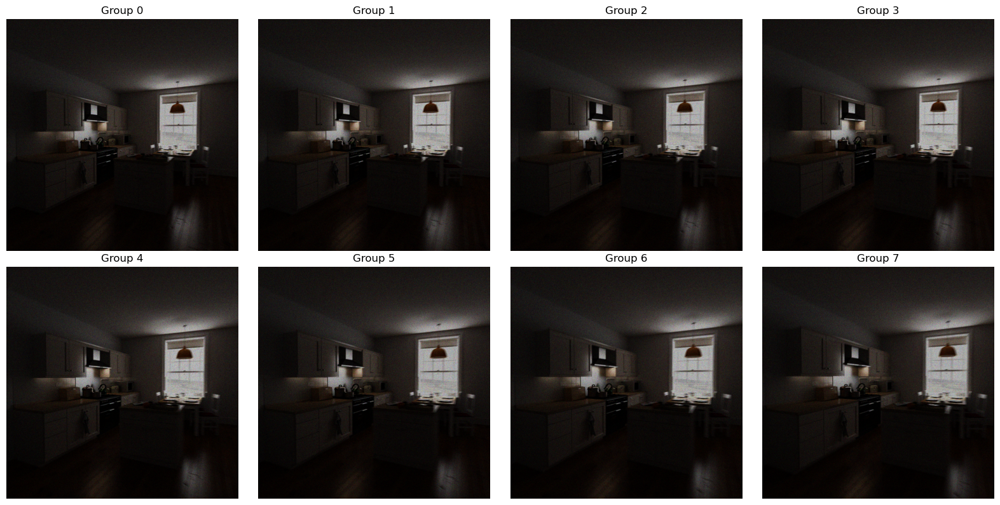

In [11]:
x_np = x[0].cpu().numpy()   # (8, 800, 800, 3)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

for i in range(8):
    img = x_np[i]
    img = img / (img.max() + 1e-8)
    axes[i].imshow(img)
    axes[i].set_title(f"Group {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


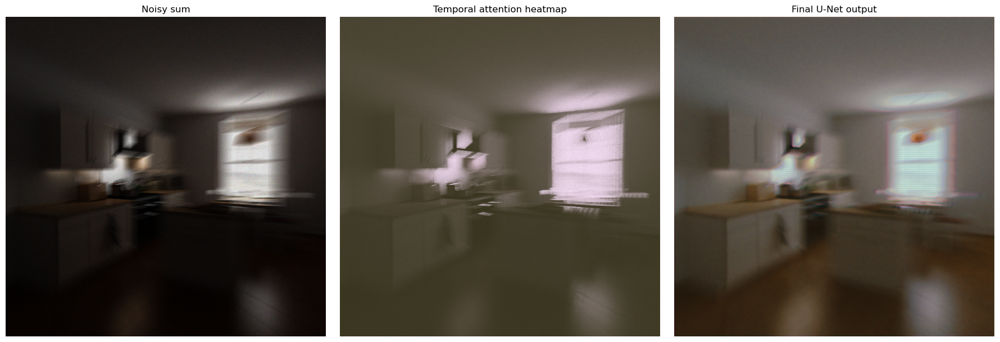

In [12]:
def chw_to_hwc(t):
    return t.detach().cpu().permute(1, 2, 0).numpy()

noisy_img = chw_to_hwc(noisy[0])
heatmap_img = chw_to_hwc(heatmap[0])
recon_img = chw_to_hwc(recon[0])

noisy_img = np.clip(noisy_img / (noisy_img.max() + 1e-8), 0, 1)
heatmap_img = np.clip(heatmap_img / (heatmap_img.max() + 1e-8), 0, 1)
recon_img = np.clip(recon_img, 0, 1)

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(noisy_img)
axes[0].set_title("Noisy sum")
axes[0].axis("off")

axes[1].imshow(heatmap_img)
axes[1].set_title("Temporal attention heatmap")
axes[1].axis("off")

axes[2].imshow(recon_img)
axes[2].set_title("Final U-Net output")
axes[2].axis("off")

plt.tight_layout()
plt.show()


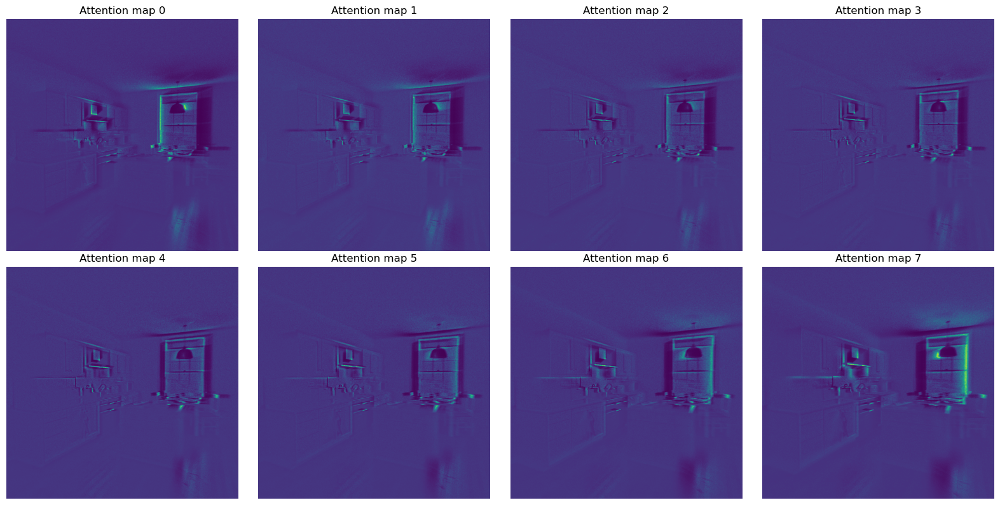

In [13]:
attn_np = attn[0, :, :, :, 0].detach().cpu().numpy()  # (8, 800, 800)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

for i in range(8):
    axes[i].imshow(attn_np[i], cmap="viridis")
    axes[i].set_title(f"Attention map {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


In [14]:
fused_input = torch.cat([noisy, heatmap], dim=1)  # (1, 6, 800, 800)


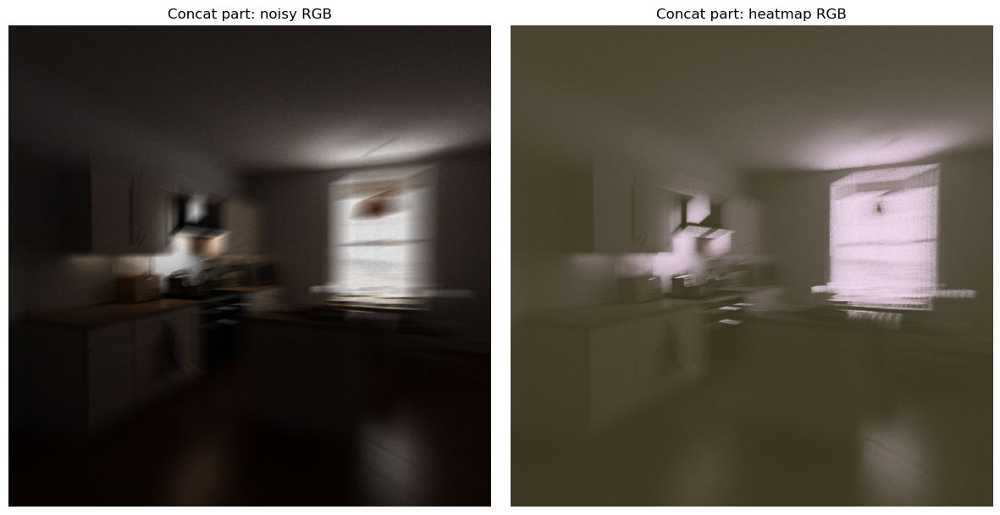

In [15]:
fused_input = torch.cat([noisy, heatmap], dim=1)
fused_noisy = chw_to_hwc(fused_input[0, 0:3])
fused_heat = chw_to_hwc(fused_input[0, 3:6])

fused_noisy = np.clip(fused_noisy / (fused_noisy.max() + 1e-8), 0, 1)
fused_heat = np.clip(fused_heat / (fused_heat.max() + 1e-8), 0, 1)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))
axes[0].imshow(fused_noisy)
axes[0].set_title("Concat part: noisy RGB")
axes[0].axis("off")

axes[1].imshow(fused_heat)
axes[1].set_title("Concat part: heatmap RGB")
axes[1].axis("off")

plt.tight_layout()
plt.show()


photoncube shape: (1024, 800, 100, 3)
dtype: uint8
bitcube shape: (1024, 800, 800, 3)
rgb_sum shape: (800, 800, 3)


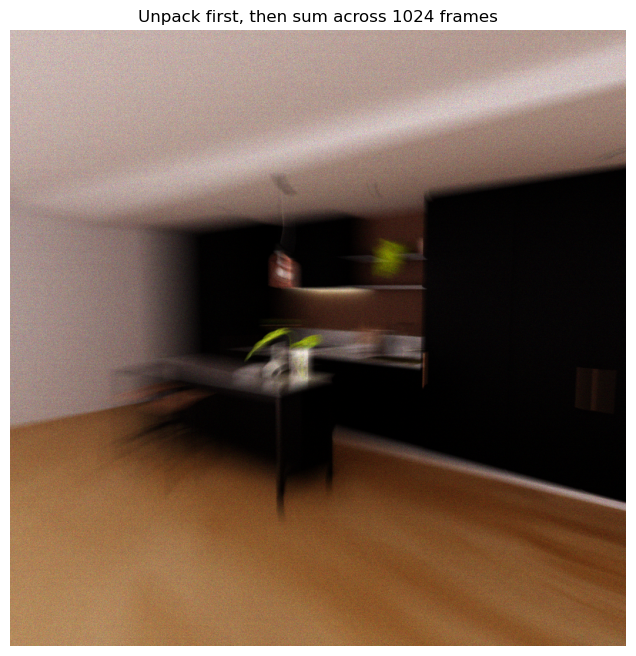

In [25]:


npy_path = "/home/skachavarapu/home/spc/train/kitchen1/000002.npy"

photoncube = np.load(npy_path, mmap_mode="r")
print("photoncube shape:", photoncube.shape)
print("dtype:", photoncube.dtype)

# First unpack axis 2: 100 -> 800
bitcube = np.unpackbits(photoncube, axis=2)
print("bitcube shape:", bitcube.shape)   # (1024, 800, 800, 3)

# Then add across the 1024 frames
rgb_sum = bitcube.sum(axis=0, dtype=np.uint32)
print("rgb_sum shape:", rgb_sum.shape)   # (800, 800, 3)

# Normalize for display
rgb_vis = rgb_sum.astype(np.float32)
rgb_vis /= (rgb_vis.max() + 1e-8)

plt.figure(figsize=(8, 8))
plt.imshow(rgb_vis)
plt.title("Unpack first, then sum across 1024 frames")
plt.axis("off")
plt.show()


photoncube shape: (1024, 800, 100, 3)
dtype: uint8
rgb_sum shape: (800, 100, 3)
rgb_sum_800 shape: (800, 800, 3)


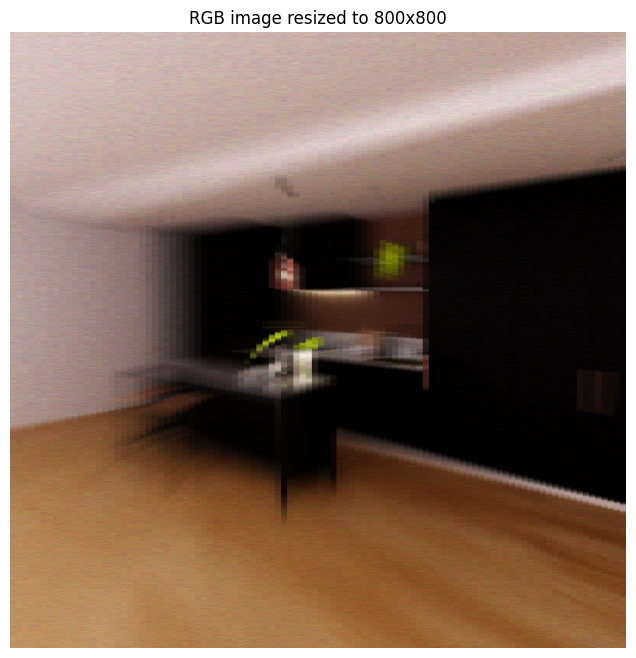

In [10]:
photoncube = np.load(npy_path, mmap_mode="r")
print("photoncube shape:", photoncube.shape)
print("dtype:", photoncube.dtype)

rgb_sum = photoncube.sum(axis=0, dtype=np.uint64)
print("rgb_sum shape:", rgb_sum.shape)   # (800, 100, 3)

# Resize width: 100 -> 800
rgb_sum_800 = np.repeat(rgb_sum, 8, axis=1)
print("rgb_sum_800 shape:", rgb_sum_800.shape)   # (800, 800, 3)

rgb_vis = rgb_sum_800.astype(np.float32)
rgb_vis /= rgb_vis.max() + 1e-8

plt.figure(figsize=(8, 8))
plt.imshow(rgb_vis)
plt.title("RGB image resized to 800x800")
plt.axis("off")
plt.show()

In [19]:
import numpy as np

npy_path = "/home/skachavarapu/home/spc/train/kitchen1/000002.npy"

photoncube = np.load(npy_path, mmap_mode="r")
print("photoncube shape:", photoncube.shape)   # (1024, 800, 100, 3)
print("dtype:", photoncube.dtype)

# Unpack axis 2: 100 -> 800
bitcube = np.unpackbits(photoncube, axis=2)
print("bitcube shape:", bitcube.shape)         # (1024, 800, 800, 3)

# Group 1024 frames into 128 groups of 8
grouped = bitcube.reshape(128, 8, 800, 800, 3)
print("grouped shape:", grouped.shape)         # (128, 8, 800, 800, 3)

# Sum the 8 frames inside each group
parts = grouped.sum(axis=1, dtype=np.uint16)
print("parts shape:", parts.shape)             # (128, 800, 800, 3)


photoncube shape: (1024, 800, 100, 3)
dtype: uint8
bitcube shape: (1024, 800, 800, 3)
grouped shape: (128, 8, 800, 800, 3)
parts shape: (128, 800, 800, 3)


photoncube shape: (1024, 800, 100, 3)
parts shape: (128, 800, 800, 3)


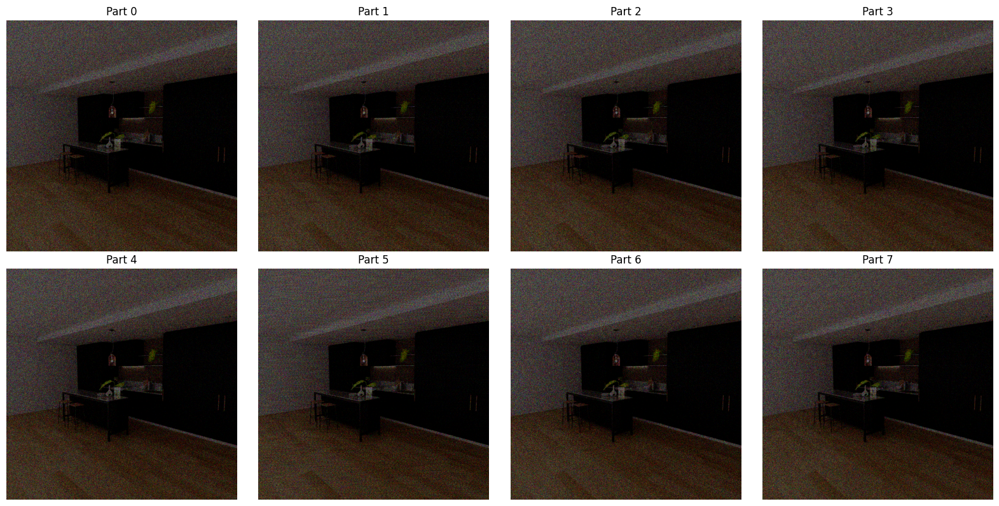

In [20]:
import numpy as np
import matplotlib.pyplot as plt

npy_path = "/home/skachavarapu/home/spc/train/kitchen1/000002.npy"

photoncube = np.load(npy_path, mmap_mode="r")
print("photoncube shape:", photoncube.shape)   # (1024, 800, 100, 3)

parts = np.zeros((128, 800, 800, 3), dtype=np.uint16)

for i in range(128):
    chunk = photoncube[i*8:(i+1)*8]                 # (8, 800, 100, 3)
    chunk_bits = np.unpackbits(chunk, axis=2)       # (8, 800, 800, 3)
    parts[i] = chunk_bits.sum(axis=0, dtype=np.uint16)

print("parts shape:", parts.shape)                  # (128, 800, 800, 3)

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

for i in range(8):
    img = parts[i].astype(np.float32)
    img /= (img.max() + 1e-8)

    axes[i].imshow(img)
    axes[i].set_title(f"Part {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()


photoncube shape: (1024, 800, 100, 3)
dtype: uint8
parts8 shape: (8, 800, 800, 3)
combined8 shape: (800, 800, 3)


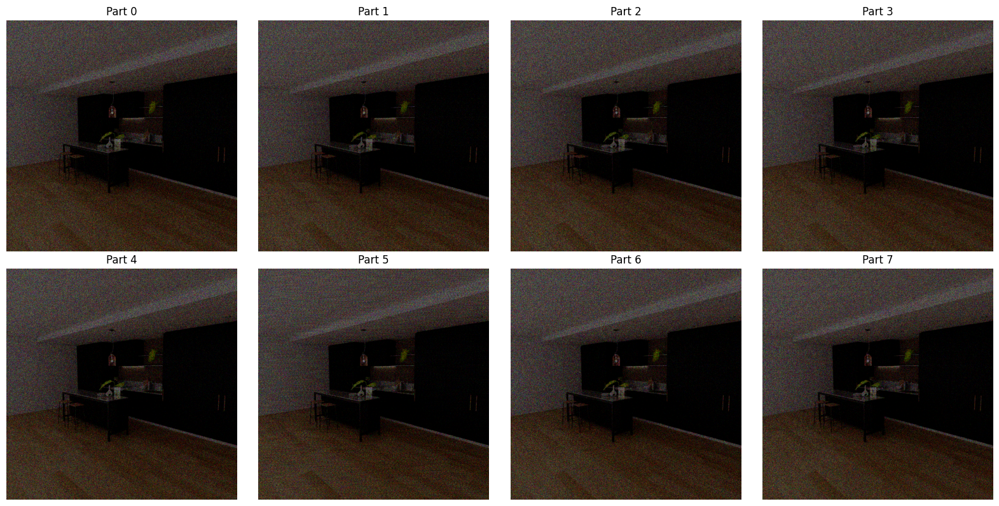

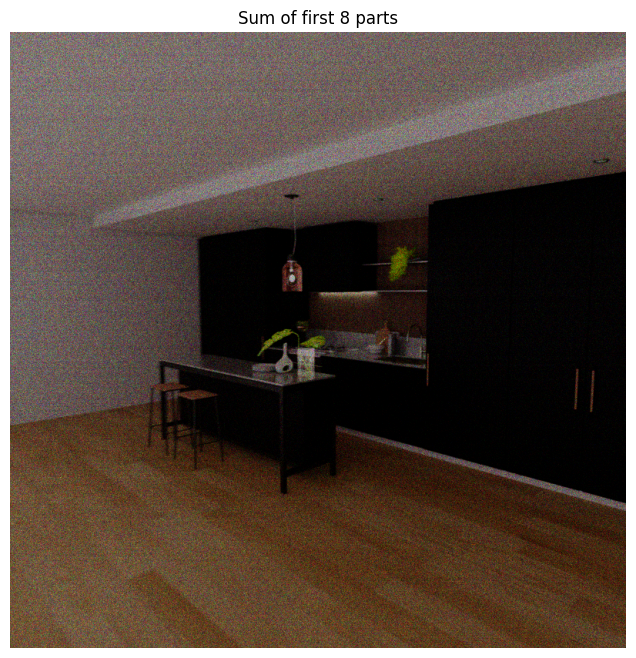

In [21]:
import numpy as np
import matplotlib.pyplot as plt

npy_path = "/home/skachavarapu/home/spc/train/kitchen1/000002.npy"

photoncube = np.load(npy_path, mmap_mode="r")
print("photoncube shape:", photoncube.shape)   # (1024, 800, 100, 3)
print("dtype:", photoncube.dtype)

# Build first 8 grouped parts, each from 8 frames
parts8 = np.zeros((8, 800, 800, 3), dtype=np.uint16)

for i in range(8):
    chunk = photoncube[i*8:(i+1)*8]            # (8, 800, 100, 3)
    chunk_bits = np.unpackbits(chunk, axis=2)  # (8, 800, 800, 3)
    parts8[i] = chunk_bits.sum(axis=0, dtype=np.uint16)

print("parts8 shape:", parts8.shape)           # (8, 800, 800, 3)

# Add these 8 parts together
combined8 = parts8.sum(axis=0, dtype=np.uint32)
print("combined8 shape:", combined8.shape)     # (800, 800, 3)

# Normalize first 8 parts with a shared scale
global_max = parts8.max()
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

for i in range(8):
    img = parts8[i].astype(np.float32) / (global_max + 1e-8)
    axes[i].imshow(img)
    axes[i].set_title(f"Part {i}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

# Show summed image of the 8 parts
combined_vis = combined8.astype(np.float32)
combined_vis /= (combined_vis.max() + 1e-8)

plt.figure(figsize=(8, 8))
plt.imshow(combined_vis)
plt.title("Sum of first 8 parts")
plt.axis("off")
plt.show()
